In [1]:
try:
    from somu import som
except ImportError:
    from torchsom import som
    print("Failed to import somu. Falling back to the torch implementation.")

import torch
import numpy as np
import matplotlib.pyplot as plt
from geomloss import SamplesLoss

np.random.seed(1234)
torch.manual_seed(1234)

/tmp/ipykernel_24711/3806645104.py:35: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('managua')


Energy Distance: 0.027927725213630517


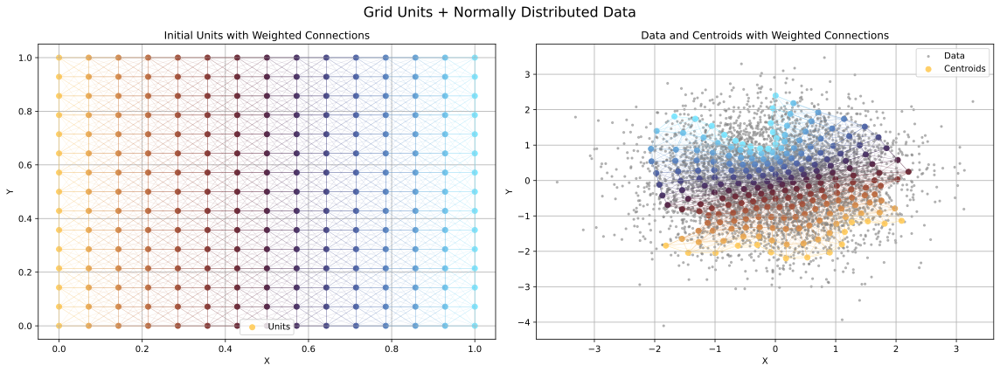

Energy Distance: 0.9607773808588864


/tmp/ipykernel_24711/3806645104.py:76: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


Energy Distance: 0.14717721428610203


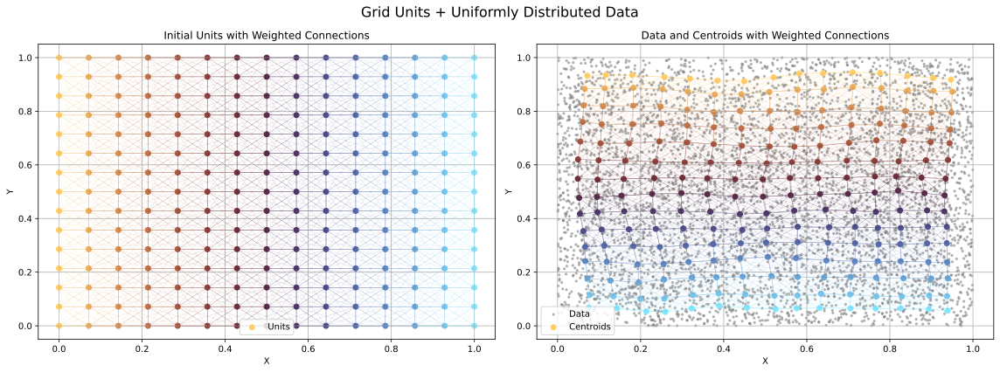

Energy Distance: 0.0008711895123599822


In [2]:
energy = SamplesLoss(loss="energy")

def generate_units(shape: str, count: int) -> np.ndarray:
    if shape == "normal":
        return np.random.randn(count, 2) / 4
    elif shape == "uniform":
        grid_size = int(np.sqrt(count))
        x, y = np.meshgrid(np.linspace(0, 1, grid_size), np.linspace(0, 1, grid_size))
        return np.vstack([x.ravel(), y.ravel()]).T

def sample(units, centroids, distribution: str, count: int, k=4) -> np.ndarray:
    points = generate_units(distribution, count)
    dists = np.linalg.norm(points[:, np.newaxis] - units, axis=2)
    topk_indices = np.argsort(dists, axis=1)[:, :k]
    topk_dists = np.sort(dists, axis=1)[:, :k]

    topk_coords = centroids[topk_indices]
    return np.sum(topk_dists[:,:,None] * topk_coords, axis=1) / np.sum(topk_dists, axis=1)[:,None]


def generate_data(distribution: str, count: int) -> np.ndarray:
    if distribution == "normal":
        return np.random.randn(count, 2)
    elif distribution == "uniform":
        return np.random.rand(count, 2)

def plot_som(X: np.ndarray, units: np.ndarray, centroids: np.ndarray, title: str, connection_threshold = 0.2):
    import matplotlib.cm as cm
    import matplotlib.colors as mcolors

    unit_distances = np.linalg.norm(units - units[:, np.newaxis], axis=2)

    # Normalize x-axis values to map to colormap
    norm = mcolors.Normalize(vmin=np.min(units[:, 0]), vmax=np.max(units[:, 0]))
    cmap = cm.get_cmap('managua')
    unit_colors = cmap(norm(units[:, 0]))

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Left plot: units with gradient-colored points and lines
    for i in range(len(units)):
        for j in range(i + 1, len(units)):
            dist = unit_distances[i, j]
            if dist < connection_threshold:
                alpha = 1.0 - dist / connection_threshold
                line_color = (unit_colors[i] + unit_colors[j]) / 2
                axes[0].plot([units[i, 0], units[j, 0]],
                             [units[i, 1], units[j, 1]],
                             color=line_color, linewidth=0.5, alpha=alpha)
    axes[0].scatter(units[:, 0], units[:, 1], color=unit_colors, label='Units')
    axes[0].set_title('Initial Units with Weighted Connections')
    axes[0].set_xlabel('X')
    axes[0].set_ylabel('Y')
    axes[0].grid(True)
    axes[0].legend()

    # Right plot: data and centroids with same unit-based coloring
    axes[1].scatter(*X.T, c='gray', label='Data', s=5, alpha=0.5)
    for i in range(len(centroids)):
        for j in range(i + 1, len(centroids)):
            dist = unit_distances[i, j]
            if dist < connection_threshold:
                alpha = 1.0 - dist / connection_threshold
                line_color = (unit_colors[i] + unit_colors[j]) / 2
                axes[1].plot([centroids[i, 0], centroids[j, 0]],
                             [centroids[i, 1], centroids[j, 1]],
                             color=line_color, linewidth=0.5, alpha=alpha)
    axes[1].scatter(*centroids.T, color=unit_colors, label='Centroids')
    axes[1].set_title('Data and Centroids with Weighted Connections')
    axes[1].set_xlabel('X')
    axes[1].set_ylabel('Y')
    axes[1].grid(True)
    axes[1].legend()

    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()



# Define configurations
configs = [
    ("normal", "normal", "Normally Distributed Units + Normally Distributed Data"),
    ("normal", "uniform", "Grid Units + Normally Distributed Data"),
    ("uniform", "normal", "Normally Distributed Units + Uniformly Distributed Data"),
    ("uniform", "uniform", "Grid Units + Uniformly Distributed Data"),
]

# Run and plot for each configuration
for data_dist, unit_shape, title in configs:
    X = generate_data(data_dist, 5000)
    units = generate_units(unit_shape, 225)
    centroids = som(X, units, 1000, 0.15, batch_size=len(X)//2, seed=np.random.randint(0, 10000))
    plot_som(X, units, centroids, title)
    print("Energy Distance:", energy(torch.tensor(X), torch.tensor(sample(units, centroids, data_dist, count=len(X)))).item())
    
